In [14]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [15]:
caminho = "zikario.gpkg"

gdf = gpd.read_file(caminho, engine="pyogrio")

print(gdf.head())
print(gdf.geometry.type.unique())

   field_1 ID_AGRAVO  DT_NOTIFIC  SEM_NOT  ID_MUNICIP  DT_SIN_PRI     DT_NASC  \
0        0       A90  2015-09-17       37      330455  2015-08-26  1976-05-10   
1        1       A90  2015-05-15       19      330455  2015-05-10  1971-05-08   
2        2       A90  2015-08-14       32      330455  2015-08-08  1965-06-28   
3        3       A90  2015-08-18       33      330455  2015-06-19  1959-06-15   
4        4       A90  2015-08-18       33      330455  2015-06-18  1988-06-15   

  CS_SEXO  ID_DISTRIT  ID_BAIRRO  NM_BAIRRO DT_OBITO   latitude  longitude  \
0       M         138        122    TAQUARA     None -22.925318 -43.388889   
1       F         139        139   REALENGO     None -22.872878 -43.425393   
2       F         136         76      IRAJA     None -22.826738 -43.329702   
3       F         137         83  MADUREIRA     None -22.879648 -43.339151   
4       F         147        114     PAVUNA     None -22.814463 -43.380845   

                      geometry  
0  POINT (-

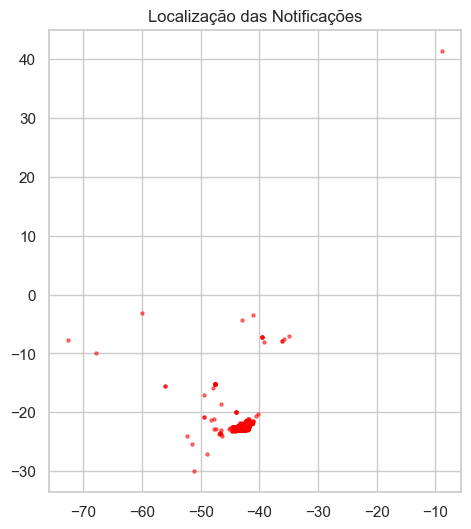

In [16]:
# Plota os pontos
gdf.plot(marker='o', color='red', markersize=5, alpha=0.5)
plt.title("Localização das Notificações")
plt.show()

In [17]:
sns.set_theme(style="whitegrid")
plt.rcParams["figure.figsize"] = (12, 6)

date_cols = ['DT_NOTIFIC', 'DT_SIN_PRI', 'DT_NASC']
for col in date_cols:
    gdf[col] = pd.to_datetime(gdf[col], errors='coerce')

disease_map = {
    'A90': 'Dengue',
    'A920': 'Chikungunya',
    'A928': 'Zika',
}

gdf['Doenca'] = gdf['ID_AGRAVO'].map(disease_map).fillna('Outro')

gdf['Ano_Mes'] = gdf['DT_SIN_PRI'].dt.to_period('M')
gdf['Semana_Epidem'] = gdf['DT_SIN_PRI'].dt.isocalendar().week
gdf = gdf[(gdf['DT_SIN_PRI'].dt.year >= 2015) & (gdf['DT_SIN_PRI'].dt.year <= 2016)]

print(gdf['Doenca'].value_counts())

Doenca
Dengue         52997
Zika           41750
Chikungunya    14307
Name: count, dtype: int64


In [18]:
lat_min, lat_max = -23.10, -22.70
lon_min, lon_max = -43.80, -43.10

gdf_rio = gdf[
    (gdf['latitude'] >= lat_min) & 
    (gdf['latitude'] <= lat_max) & 
    (gdf['longitude'] >= lon_min) & 
    (gdf['longitude'] <= lon_max)
].copy()

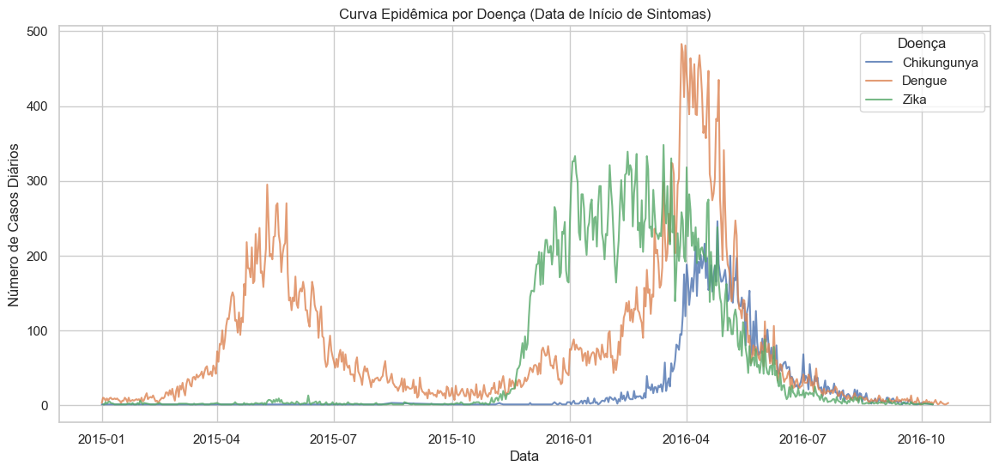

In [19]:
daily_counts = gdf_rio.groupby(['DT_SIN_PRI', 'Doenca']).size().reset_index(name='Casos')

plt.figure(figsize=(14, 6))
sns.lineplot(data=daily_counts, x='DT_SIN_PRI', y='Casos', hue='Doenca', alpha=0.8)
plt.title('Curva Epidêmica por Doença (Data de Início de Sintomas)')
plt.ylabel('Número de Casos Diários')
plt.xlabel('Data')
plt.legend(title='Doença')
plt.show()

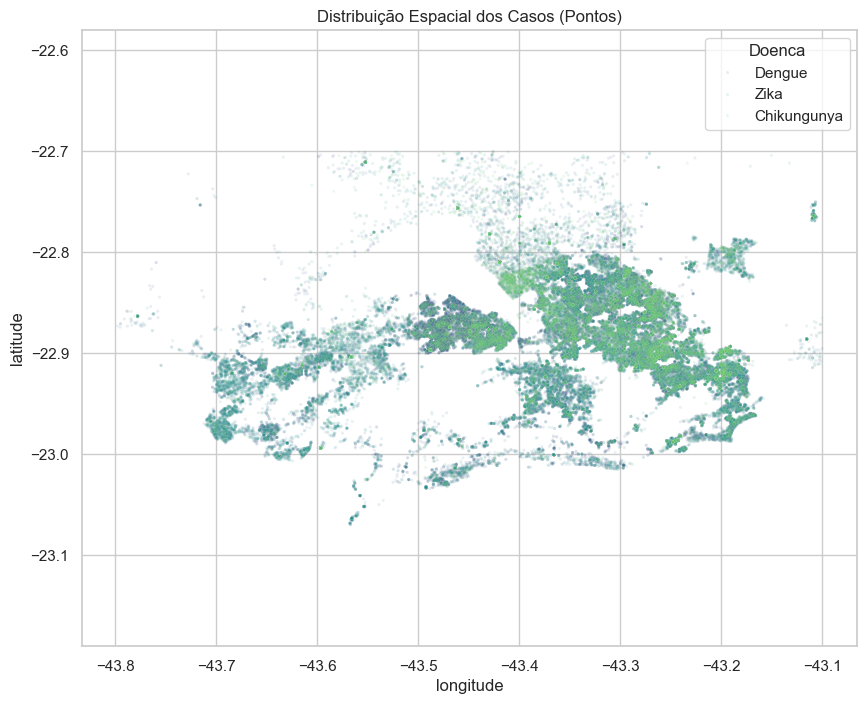

In [20]:
plt.figure(figsize=(10, 8))
sns.scatterplot(
    data=gdf_rio, 
    x='longitude', 
    y='latitude', 
    hue='Doenca', 
    alpha=0.1, 
    s=5,
    palette='viridis'
)
plt.title('Distribuição Espacial dos Casos (Pontos)')
plt.axis('equal') 
plt.show()

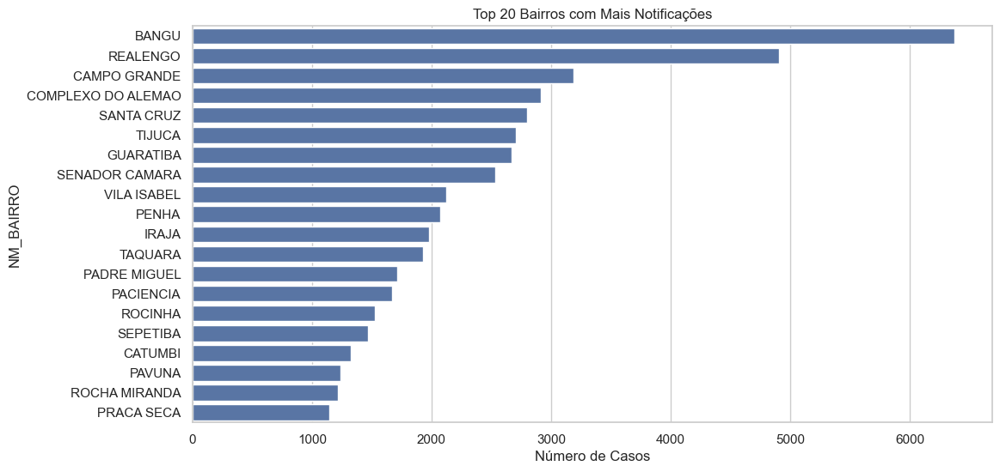

In [21]:
bairros_top = gdf_rio['NM_BAIRRO'].value_counts().head(20)

plt.figure(figsize=(12, 6))
sns.barplot(x=bairros_top.values, y=bairros_top.index)
plt.title('Top 20 Bairros com Mais Notificações')
plt.xlabel('Número de Casos')
plt.show()

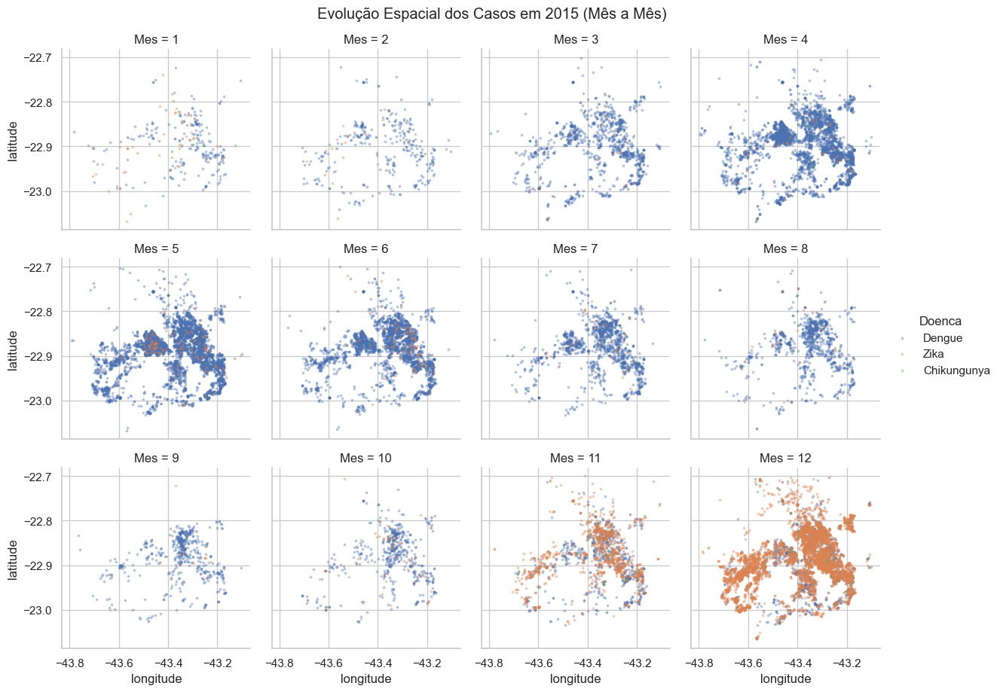

In [22]:
gdf_2015 = gdf_rio[gdf_rio['DT_SIN_PRI'].dt.year == 2015].copy()
gdf_2015['Mes'] = gdf_2015['DT_SIN_PRI'].dt.month

g = sns.FacetGrid(gdf_2015, col="Mes", col_wrap=4, hue="Doenca", height=3)
g.map(plt.scatter, "longitude", "latitude", alpha=0.3, s=3)
g.add_legend()
g.fig.suptitle('Evolução Espacial dos Casos em 2015 (Mês a Mês)', y=1.02)
plt.show()

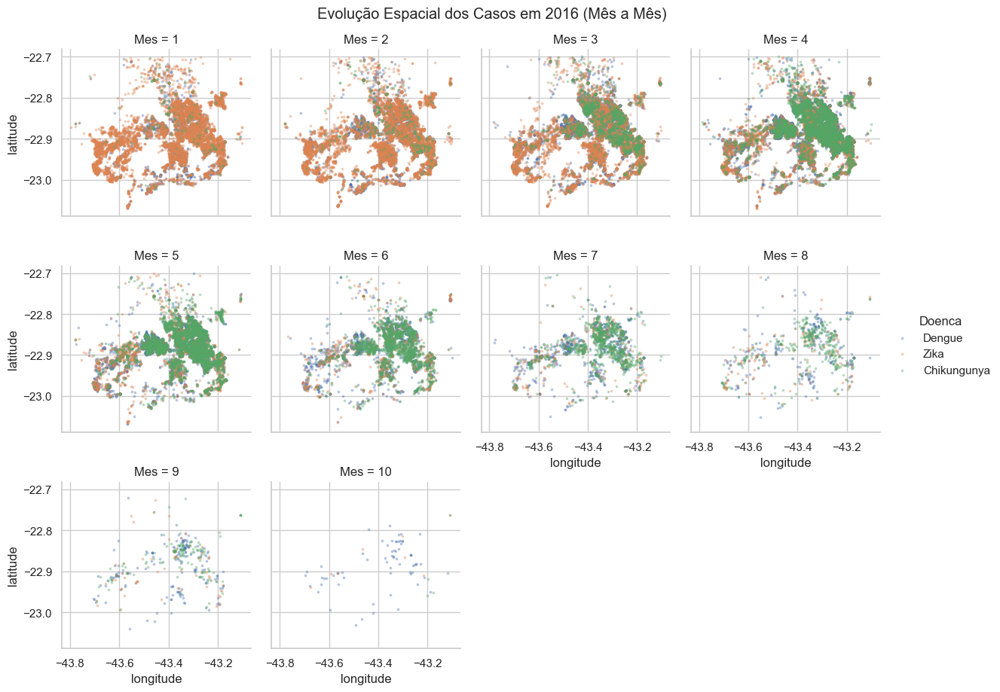

In [25]:
gdf_2016 = gdf_rio[gdf_rio['DT_SIN_PRI'].dt.year == 2016].copy()
gdf_2016['Mes'] = gdf_2016['DT_SIN_PRI'].dt.month

g = sns.FacetGrid(gdf_2016, col="Mes", col_wrap=4, hue="Doenca", height=3)
g.map(plt.scatter, "longitude", "latitude", alpha=0.3, s=3)
g.add_legend()
g.fig.suptitle('Evolução Espacial dos Casos em 2016 (Mês a Mês)', y=1.02)
plt.show()

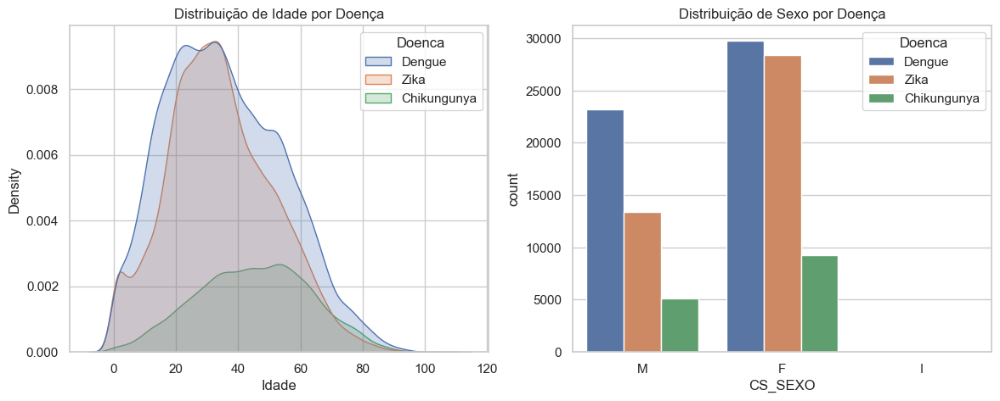

In [23]:
# Calcular Idade
now = pd.Timestamp('now')
gdf['Idade'] = (gdf['DT_SIN_PRI'] - gdf['DT_NASC']).dt.days / 365.25

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Idade
sns.kdeplot(data=gdf, x='Idade', hue='Doenca', fill=True, ax=axes[0])
axes[0].set_title('Distribuição de Idade por Doença')

# Sexo
sns.countplot(data=gdf, x='CS_SEXO', hue='Doenca', ax=axes[1])
axes[1].set_title('Distribuição de Sexo por Doença')

plt.show()

In [24]:
import plotly.express as px

gdf_rio['Data_Texto'] = gdf_rio['DT_SIN_PRI'].dt.strftime('%Y-%m-%d')

fig = px.scatter_mapbox(
    gdf_rio, 
    lat="latitude", 
    lon="longitude",     
    color="Doenca",                 
    size_max=15,                     
    zoom=10,                         
    mapbox_style="carto-positron",  
    title="Mapa Interativo de Casos (Rio de Janeiro - 2016)",
    
    hover_data={
        'latitude': False,  
        'longitude': False,
        'NM_BAIRRO': True,   
        'Data_Texto': True   
    },
    opacity=0.5              
)

fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
fig.show()

C:\Users\segun\AppData\Local\Temp\ipykernel_34296\1148086062.py:5: DeprecationWarning:

*scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/

